# Part 9 - K-Means, Agglomerative & DBSCAN Clustering

**By Aziz Presswala**

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from prettytable import PrettyTable
from wordcloud import WordCloud, STOPWORDS

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn import model_selection

from gensim.models import Word2Vec

## [1.0] Sampling Data

In [2]:
# Using the CleanedText column saved in final.sqlite db
con = sqlite3.connect('final.sqlite')
filtered_data = pd.read_sql_query("SELECT * FROM Reviews", con)
filtered_data.shape

(364171, 12)

In [3]:
# replacing all the 'positive' values of the Score attribute with 1
filtered_data['Score']=filtered_data['Score'].replace('positive',1)

In [4]:
# replacing all the 'neagtive' values of the Score attribute with 0
filtered_data['Score']=filtered_data['Score'].replace('negative',0)

**For K Means**

In [5]:
#randomly selecting 30k points from the dataset
x=filtered_data.sample(30000)

**For Agglomerative & DBSCAN**

In [6]:
#randomly selecting 5k points from the dataset
x=filtered_data.sample(5000)

## [2.0] Featurization

### [2.1] BAG OF WORDS

In [10]:
#applying fit transform on train datasset
count_vect = CountVectorizer(min_df=10)
x_bow = count_vect.fit_transform(x['CleanedText'].values)
x_bow.shape

(30000, 4921)

### [2.2] TF-IDF

In [6]:
#applying fit transform on train datasset
tf_idf_vect = TfidfVectorizer(min_df=10)
x_tfidf = tf_idf_vect.fit_transform(x['CleanedText'].values)
x_tfidf.shape

(30000, 4938)

### [2.3] Avg. Word2Vec

In [12]:
#training Word2Vec Model for train dataset
i=0
list_of_sent=[]
for sent in x['CleanedText'].values:
    list_of_sent.append(sent.split())

In [13]:
w2v_model=Word2Vec(list_of_sent,min_count=5,size=50, workers=4)

In [14]:
X = w2v_model[w2v_model.wv.vocab]

In [15]:
#computing Avg Word2Vec for the dataset
w2v_words = list(w2v_model.wv.vocab)
sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sent): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))

100%|███████████████████████████████████████████████████████████████████████████| 30000/30000 [01:34<00:00, 317.24it/s]


30000
50


In [16]:
x_w2v = np.array(sent_vectors)
x_w2v.shape

(30000, 50)

### [2.4] TFIDF - Word2Vec

In [17]:
# training model for the data
model = TfidfVectorizer()
tf_idf_matrix = model.fit_transform(x['CleanedText'].values)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))

In [18]:
# TF-IDF weighted Word2Vec
tfidf_feat = model.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sent): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            # tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors.append(sent_vec)
    row += 1

100%|███████████████████████████████████████████████████████████████████████████| 30000/30000 [01:54<00:00, 261.87it/s]


In [19]:
x_tfw2v = np.array(tfidf_sent_vectors)
x_tfw2v.shape

(30000, 50)

## [3.0] K-Means Clustering

### [3.1] Applying K-Means Clustering on BOW,<font color='red'> SET 1</font>

In [20]:
# k values we need to try on the model
k_values = list(range(2,11))
loss = []
for i in k_values:
    # initializing kmeans clustering model
    kmeans = KMeans(n_clusters=i, n_jobs=-1)
    kmeans.fit(x_bow)
    loss.append(kmeans.inertia_)

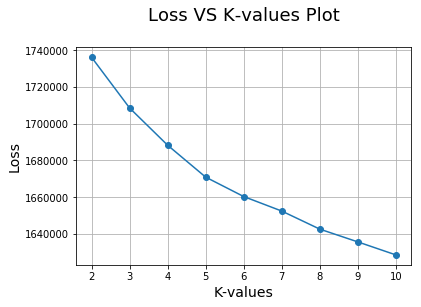

In [21]:
# Plotting loss VS k_values
plt.plot(k_values, loss, '-o')
plt.xlabel('K-values',size=14)
plt.ylabel('Loss',size=14)
plt.title('Loss VS K-values Plot\n',size=18)
plt.grid()
plt.show()

**OBSERVATION:-**
From the above plot we can observe that error decreases steeply till k=6 & after that it decreases slowly.
Therefore, optimal k=6.

In [23]:
# optimal k value
optimal_k=6

# training the model using optimal k 
kmeans=KMeans(n_clusters=optimal_k, n_jobs=-1)
kmeans.fit(x_bow)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=6, n_init=10, n_jobs=-1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

### [3.1.1] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

In [12]:
#Plot each cluster features in a cloud
def plot_cluster_cloud(features, coef):
    coef_df = pd.DataFrame(coef, columns = features)
    print(len(coef_df))
    # Create a figure and set of 10 subplots because our k range is between 2-10 
    fig, axes = plt.subplots(5, 2, figsize = (30, 20))
    fig.suptitle("Top 20 words for each cluster ", fontsize = 50)
    cent = range(len(coef_df))
    for ax, i in zip(axes.flat, cent):
        wordcloud = WordCloud(background_color = "white").generate_from_frequencies(
                              coef_df.iloc[i,:].sort_values(ascending = False)[0:20])
        ax.imshow(wordcloud)
        ax.set_title("Cluster {} word cloud".format(i+1), fontsize = 30)
        ax.axis("off")
    plt.tight_layout()
    fig.subplots_adjust(top = 0.90)
    plt.show()

6


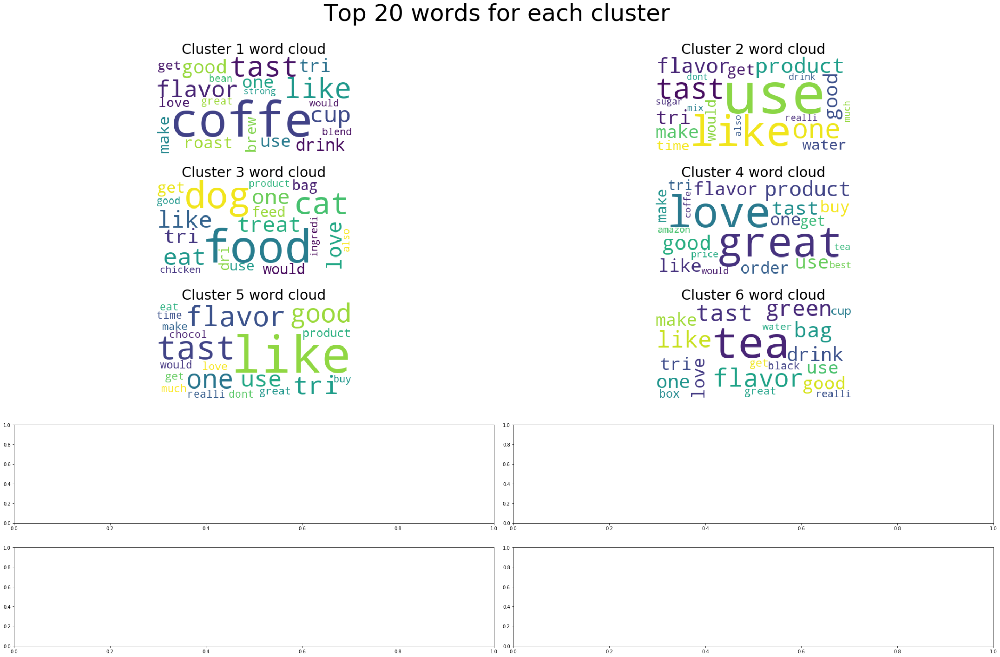

In [13]:
# getting feature names in features 
# and the cluster centers in coef
# Plot the all cluster with their corresponding features
features = count_vect.get_feature_names()
coef = kmeans.cluster_centers_
plot_cluster_cloud(features, coef)

**Inference**
- Cluster 1 - This has gropued all reviews related to coffee, blends of coffee, cup of coffee, flavor of coffee etc.
- Cluster 2 - This has grouped products which talks about products quality & its usage.
- Cluster 3 - This has gropued all reviews related to pet food such as dog & cat food.
- Cluster 4 - This has gropued all reviews related to how good, great and lovely the product is.
- Cluster 5 - This has gropued all reviews that talks about the flavor, taste & goodness of a product.
- Cluster 6 - This has gropued all reviews related to tea, blends of tea, cup of tea, flavor of tea etc.

### [3.2] Applying K-Means Clustering on TFIDF,<font color='red'> SET 2</font>

In [7]:
# k values we need to try on the model
k_values = list(range(2,11))
loss = []
for i in k_values:
    # initializing kmeans clustering model
    kmeans = KMeans(n_clusters=i, n_jobs=-1)
    kmeans.fit(x_tfidf)
    loss.append(kmeans.inertia_)                

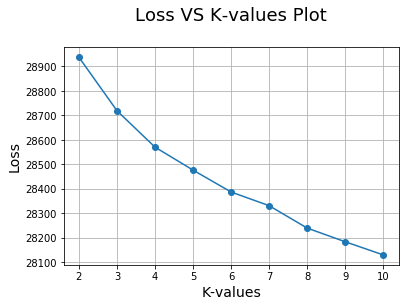

In [9]:
# Plotting loss VS k_values
plt.plot(k_values, loss, '-o')
plt.xlabel('K-values',size=14)
plt.ylabel('Loss',size=14)
plt.title('Loss VS K-values Plot\n',size=18)
plt.grid()
plt.show()

In [10]:
# optimal k value
optimal_k=7

# training the model using optimal k 
kmeans=KMeans(n_clusters=optimal_k, n_jobs=-1)
kmeans.fit(x_tfidf)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=7, n_init=10, n_jobs=-1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

### [3.2.1] Wordclouds of clusters obtained after applying k-means on TFIDF<font color='red'> SET 2</font>

7


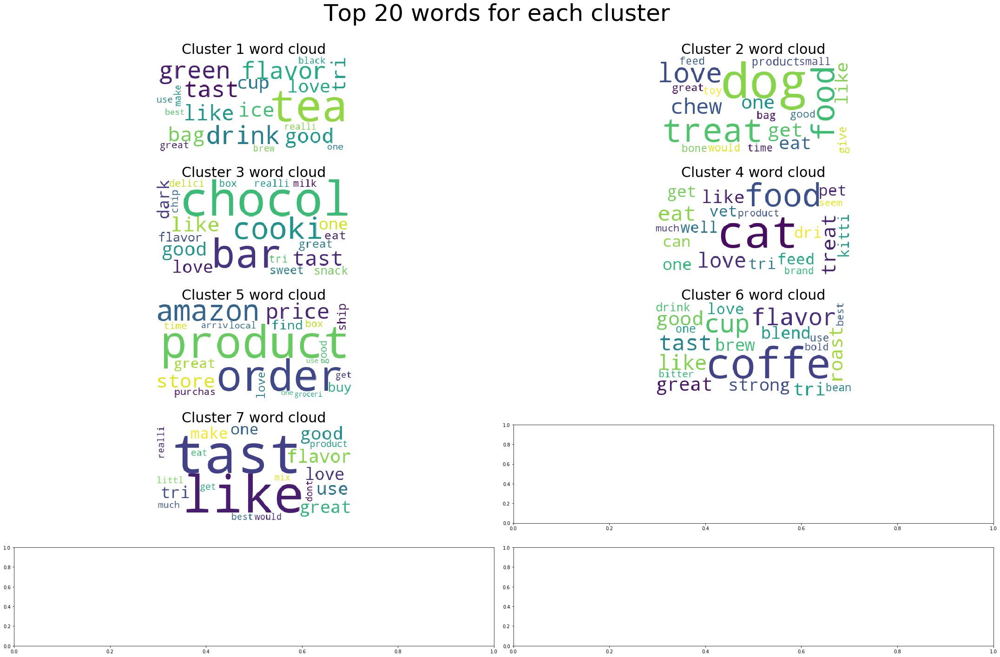

In [13]:
# getting feature names in features 
# and the cluster centers in coef
# Plot the all cluster with their corresponding features
features = tf_idf_vect.get_feature_names()
coef = kmeans.cluster_centers_
plot_cluster_cloud(features, coef)

**Inference**
- Cluster 1 - This has gropued all reviews related to tea - flavor, taste, cup etc.
- Cluster 2 - This has grouped all reviews related to dog food.
- Cluster 3 - This has gropued all reviews related to chocolate like chocolate bars, cookies, milk & dark chocolate etc.
- Cluster 4 - This has grouped all reviews related to cat food.
- Cluster 5 - This talks about amazons services and products. It aso has grouped reviews which talks about price of products. 
- Cluster 6 - This has gropued all reviews related to tea - flavor, taste, cup etc.
- Cluster 7 - This has gropued all reviews that talks about the flavor, taste & goodness of a product.

### [3.3] Applying K-Means Clustering on AVG W2V,<font color='red'> SET 3</font>

In [27]:
# k values we need to try on the model
k_values = list(range(2,11))
loss = []
for i in k_values:
    # initializing kmeans clustering model
    kmeans = KMeans(n_clusters=i, n_jobs=-1)
    kmeans.fit(x_w2v)
    loss.append(kmeans.inertia_)

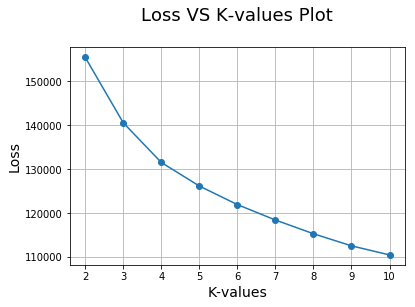

In [28]:
# Plotting loss VS k_values
plt.plot(k_values, loss, '-o')
plt.xlabel('K-values',size=14)
plt.ylabel('Loss',size=14)
plt.title('Loss VS K-values Plot\n',size=18)
plt.grid()
plt.show()

In [29]:
# optimal k value
optimal_k=6

# training the model using optimal k 
kmeans=KMeans(n_clusters=optimal_k, n_jobs=-1)
kmeans.fit(x_w2v)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=6, n_init=10, n_jobs=-1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [32]:
# Assign each review to its cluster label
# i.e. Which review belongs to which cluster
x["cluster_label"] = kmeans.labels_

### [3.3.1] Wordclouds of clusters obtained after applying k-means on AVG W2V<font color='red'> SET 3</font>

In [30]:
def plot_word_cloud(txt):
    # store each word from review
    cloud = " ".join(word for word in txt)
    cloud
    # Remove duplicate words
    stopwords = set(STOPWORDS) 
    # call built-in method WordCloud for creating an object for drawing a word cloud 
    wordcloud = WordCloud(width = 1000, height = 600, background_color ='white', stopwords = stopwords).generate(cloud)
    # plot the WordCloud image                        
    plt.figure(figsize = (10, 8))
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis("off") 
    plt.title("World cloud of top words")
    plt.tight_layout(pad = 0)
  
    plt.show()

Total number of review in cluster 0 is: 2946


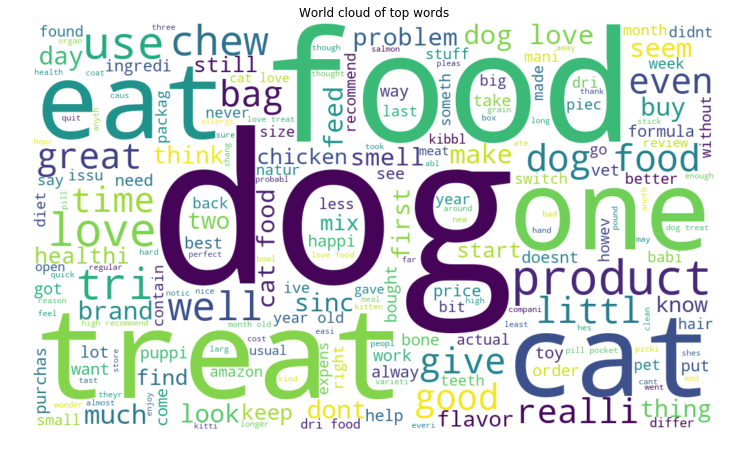

Total number of review in cluster 1 is: 4603


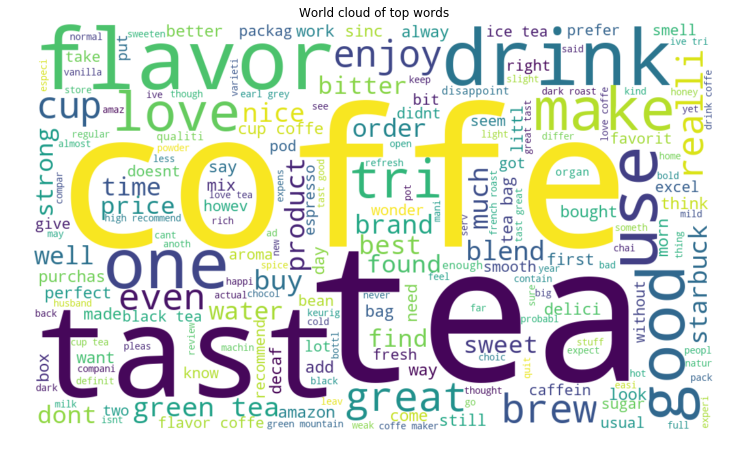

Total number of review in cluster 2 is: 6248


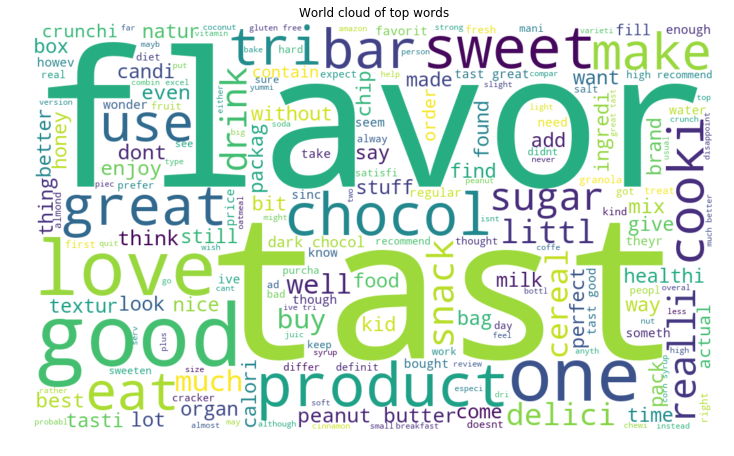

Total number of review in cluster 3 is: 3959


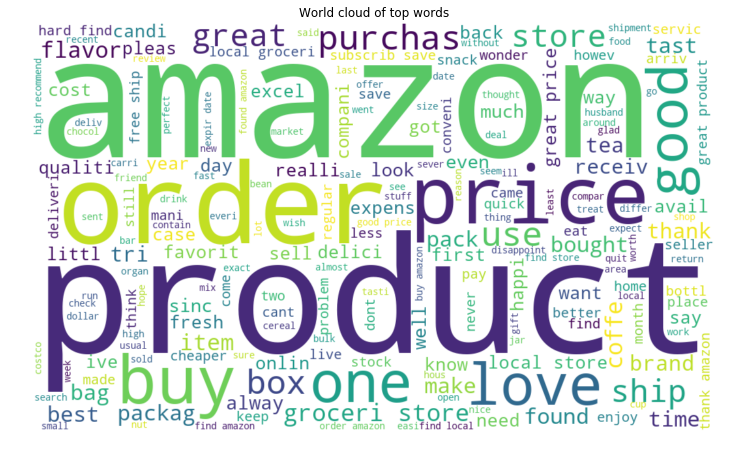

Total number of review in cluster 4 is: 4923


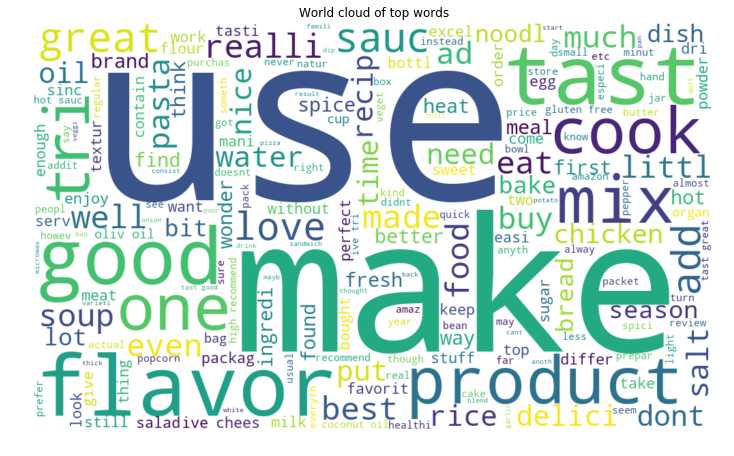

Total number of review in cluster 5 is: 7321


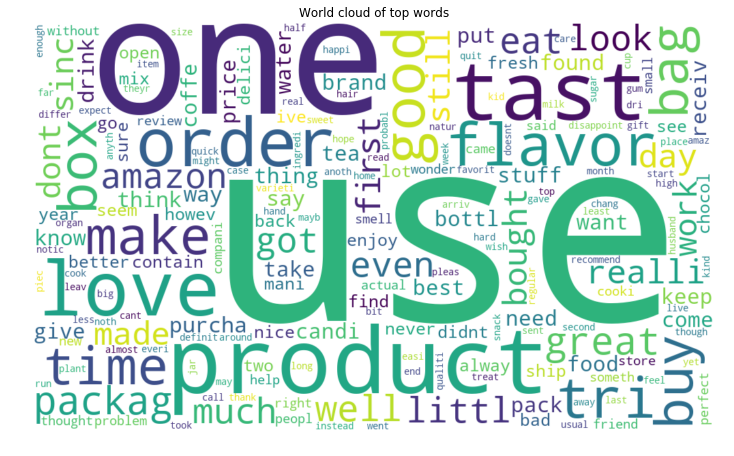

In [41]:
# For each cluster, group with its corresponding label.
for i in range(kmeans.n_clusters):
    l = list()
    label = x.groupby(["cluster_label"]).groups[i]
    # For each label get the total review and put into a list(l)
    for j in range(len(label)):
        l.append(x.loc[label[j]]["CleanedText"])
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    # Call plot_word_cloud method to plot review in each cluster 
    plot_word_cloud(l)

**Inference**
- Cluster 1 - This has gropued all reviews related to pet food such as dog & cat food.
- Cluster 2 - This has gropued all reviews related to tea & coffee, their blends,flavor etc.
- Cluster 3 - This has gropued all reviews that talks about the flavor, taste & goodness of a product.
- Cluster 4 - This talks about amazons services and products. It aso has grouped reviews which talks about price of products.
- Cluster 5 - This has grouped reviews which talks mostly about how packed food can be cooked.
- Cluster 6 - This has gruoped reviews related to the use of a product as well as their taste & flavor.

### [3.4] Applying K-Means Clustering on TFIDF W2V,<font color='red'> SET 4</font>

In [45]:
# k values we need to try on the model
k_values = list(range(2,11))
loss = []
for i in k_values:
    # initializing kmeans clustering model
    kmeans = KMeans(n_clusters=i, n_jobs=-1)
    kmeans.fit(x_tfw2v)
    loss.append(kmeans.inertia_)

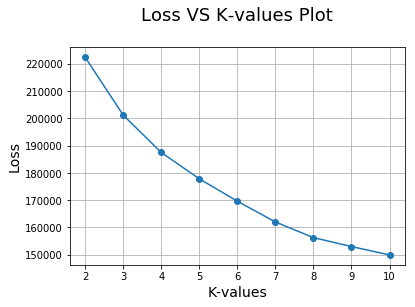

In [46]:
# Plotting loss VS k_values
plt.plot(k_values, loss, '-o')
plt.xlabel('K-values',size=14)
plt.ylabel('Loss',size=14)
plt.title('Loss VS K-values Plot\n',size=18)
plt.grid()
plt.show()

In [47]:
# optimal k value
optimal_k=6

# training the model using optimal k 
kmeans=KMeans(n_clusters=optimal_k, n_jobs=-1)
kmeans.fit(x_w2v)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=6, n_init=10, n_jobs=-1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [48]:
# Assign each review to its cluster label
# i.e. Which review belongs to which cluster
x["cluster_label"] = kmeans.labels_

### [3.4.1] Wordclouds of clusters obtained after applying k-means on TFIDF W2V<font color='red'> SET 4</font>

Total number of review in cluster 0 is: 6251


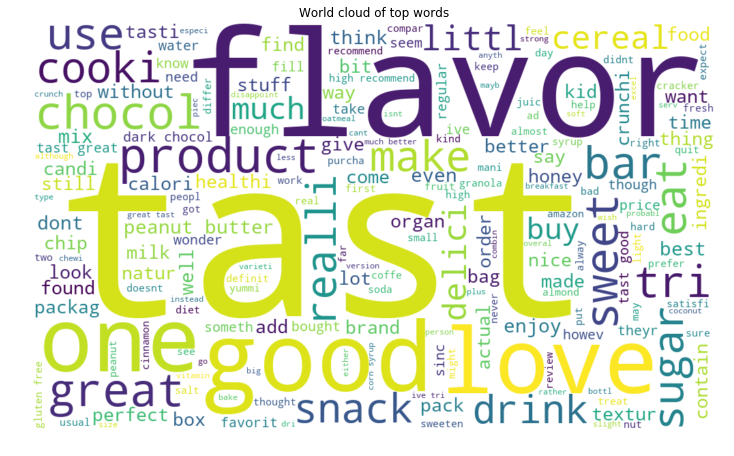

Total number of review in cluster 1 is: 2947


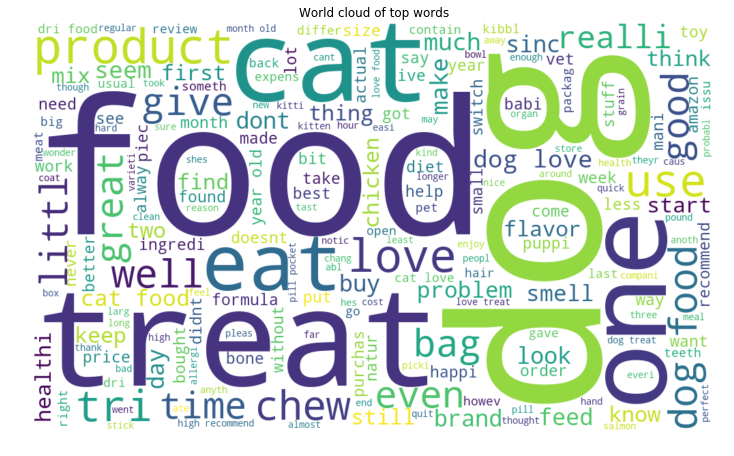

Total number of review in cluster 2 is: 3957


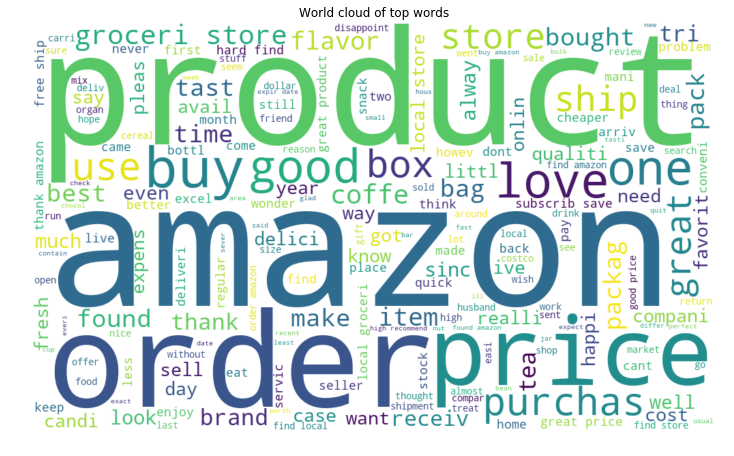

Total number of review in cluster 3 is: 7324


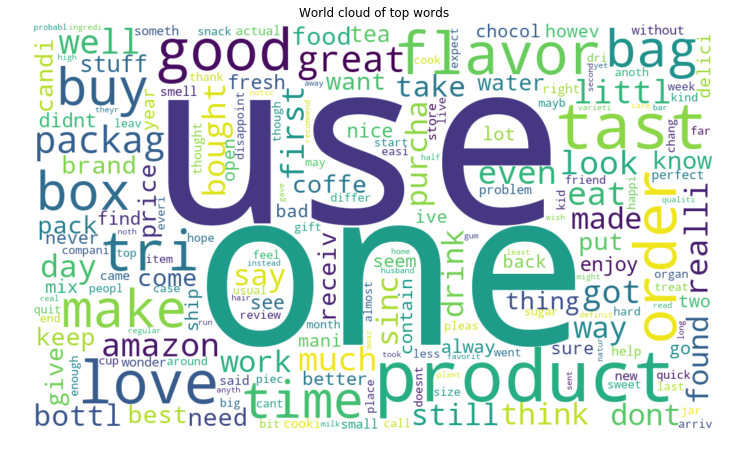

Total number of review in cluster 4 is: 4917


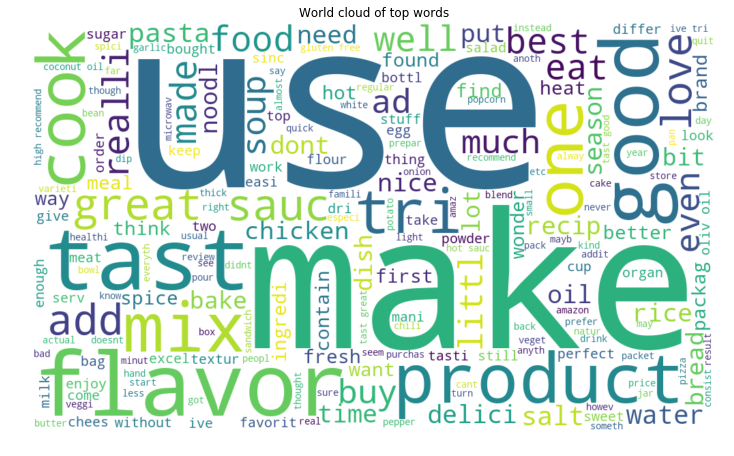

Total number of review in cluster 5 is: 4604


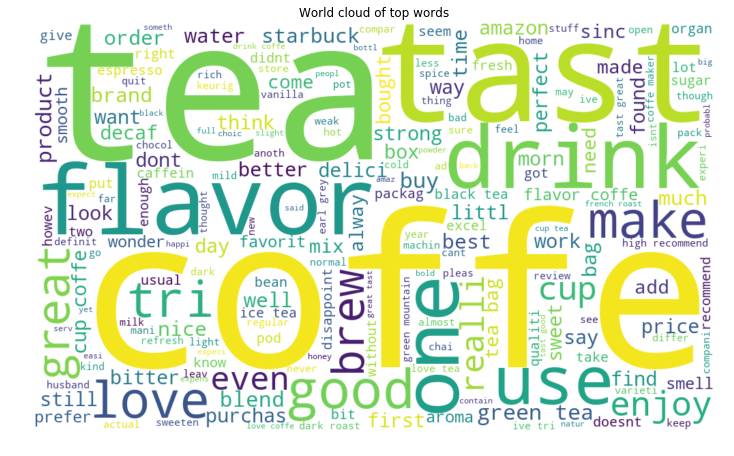

In [49]:
# For each cluster, group with its corresponding label.
for i in range(kmeans.n_clusters):
    l = list()
    label = x.groupby(["cluster_label"]).groups[i]
    # For each label get the total review and put into a list(l)
    for j in range(len(label)):
        l.append(x.loc[label[j]]["CleanedText"])
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    # Call plot_word_cloud method to plot review in each cluster 
    plot_word_cloud(l)

**Inference**
- Cluster 1 - This cluster seems to have groped reviews which talks about snacks. Snacks include sweets, chocolate, drinks etc. 
- Cluster 2 - This has gropued all reviews related to pet food such as dog & cat food.
- Cluster 3 - This talks about amazons services and products. It aso has grouped reviews which talks about price of products.
- Cluster 4 - This has gruoped reviews related to the use of a product as well as their taste & flavor.
- Cluster 5 - This has grouped reviews which talks mostly about how packed food can be cooked & used.
- Cluster 6 - This has gropued all reviews related to tea & coffee

## [4.0] Agglomerative Clustering

### [4.1] Applying Agglomerative Clustering on AVG W2V,<font color='red'> SET 3</font>

**Number of Clusters = 2**

In [56]:
AC = AgglomerativeClustering(n_clusters = 2, affinity = "euclidean", linkage = "ward")
labels = AC.fit_predict(x_w2v)

In [57]:
# Assign each review to its cluster label in dataframe
x["cluster_label"] = AC.labels_

Total number of review in cluster 0 is: 3570


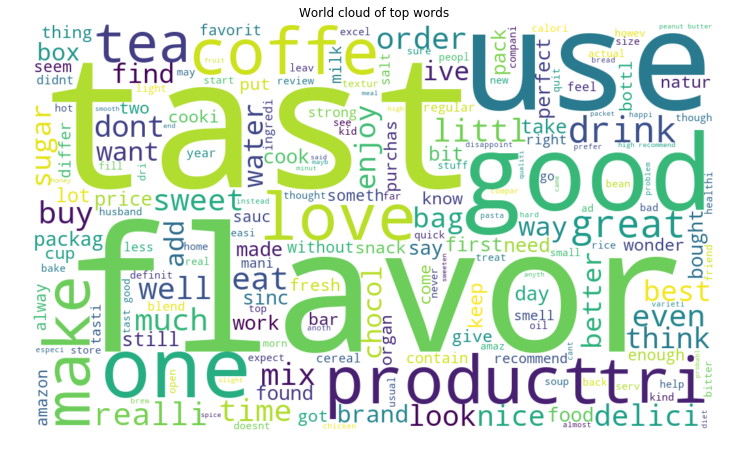

Total number of review in cluster 1 is: 1430


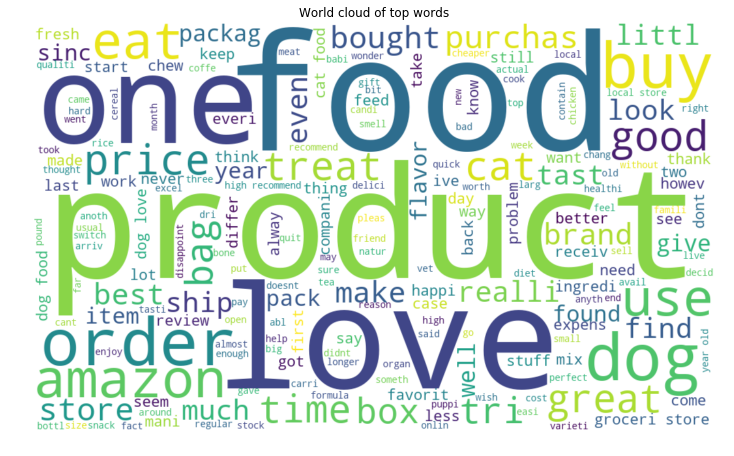

In [59]:
# same as average word2vec of k means clustering
for i in range(AC.n_clusters):
    l = list()
    label = x.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(x.loc[label[j]]["CleanedText"])
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

**Inference**
- Cluster 1 - This has gropued all reviews related to tea & coffee. 
- Cluster 2 - This talks about amazons services and products. It aso has grouped reviews which talks about price of products &
how they love the product that they ordered.

**Number of Clusters=5**

In [60]:
AC = AgglomerativeClustering(n_clusters = 5, affinity = "euclidean", linkage = "ward")
labels = AC.fit_predict(x_w2v)

In [61]:
# Assign each review to its cluster label in dataframe
x["cluster_label"] = AC.labels_

Total number of review in cluster 0 is: 939


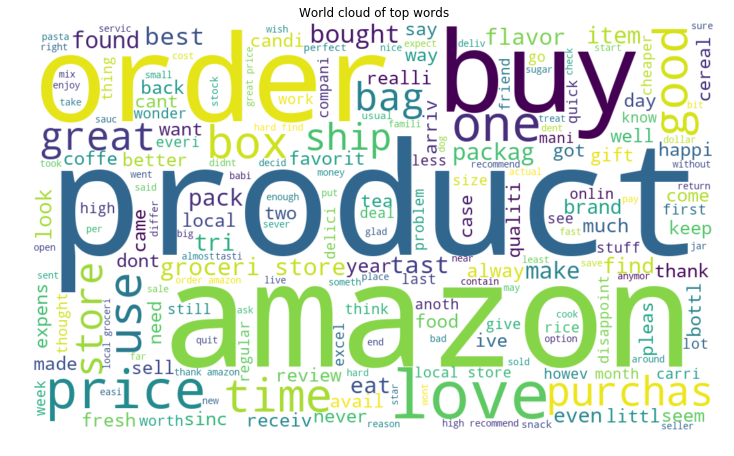

Total number of review in cluster 1 is: 1504


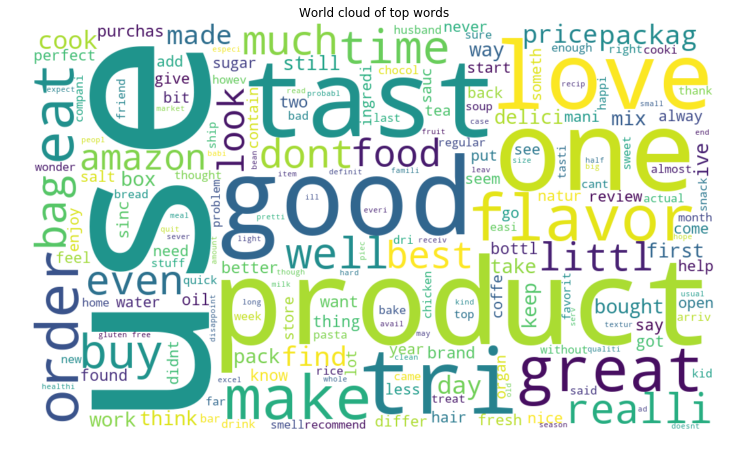

Total number of review in cluster 2 is: 798


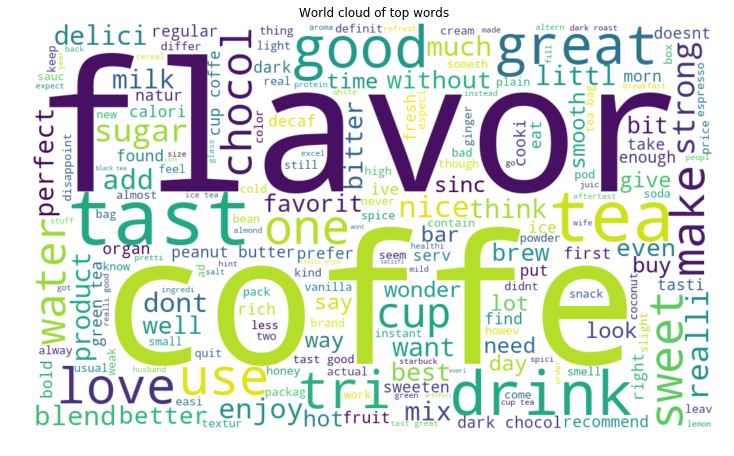

Total number of review in cluster 3 is: 491


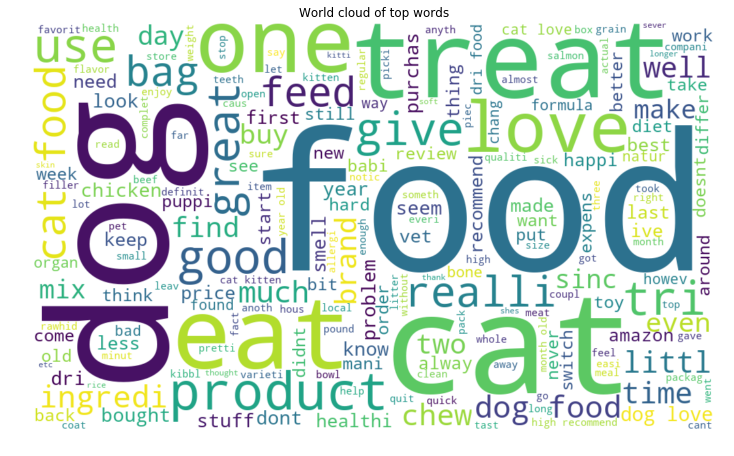

Total number of review in cluster 4 is: 1268


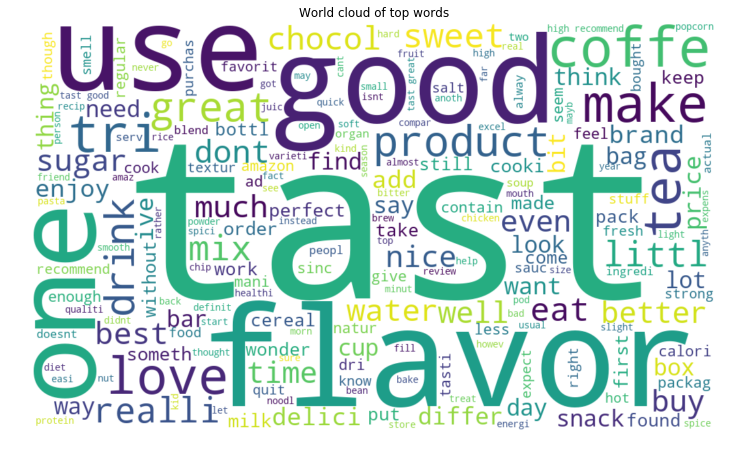

In [62]:
# same as average word2vec of k means clustering
for i in range(AC.n_clusters):
    l = list()
    label = x.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(x.loc[label[j]]["CleanedText"])
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

**Inference**
- Cluster 1 - This talks about amazons services and products. It aso has grouped reviews which talks about price of products. 
- Cluster 2 - This has gruoped reviews related to the use of a product as well as their taste & flavor and how good they are.
- Cluster 3 - This has gropued all reviews related to tea & coffee, their flavor etc.
- Cluster 4 - This has gruoped reviews related dog & cat food.
- Cluster 5 - This has gruoped reviews related to the use of a product as well as their taste & flavor.

### [4.2] Applying Agglomerative Clustering on TFIDF W2V,<font color='red'> SET 4</font>

**Number of Clusters=2**

In [66]:
AC = AgglomerativeClustering(n_clusters = 2, affinity = "euclidean", linkage = "ward")
labels = AC.fit_predict(x_tfw2v)

In [67]:
# Assign each review to its cluster label in dataframe
x["cluster_label"] = AC.labels_

Total number of review in cluster 0 is: 3402


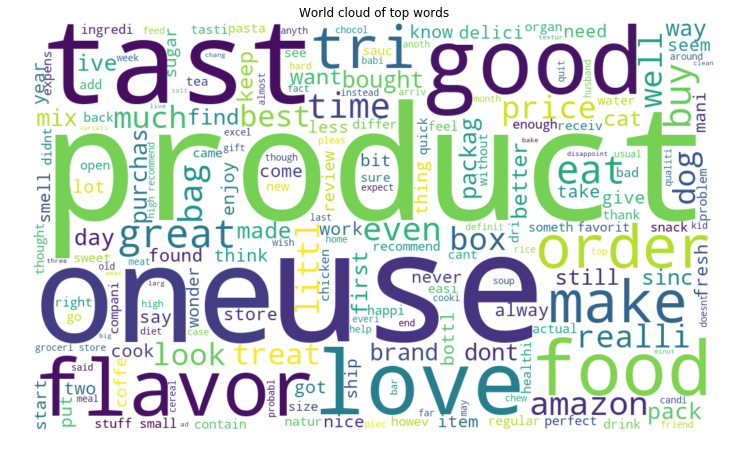

Total number of review in cluster 1 is: 1598


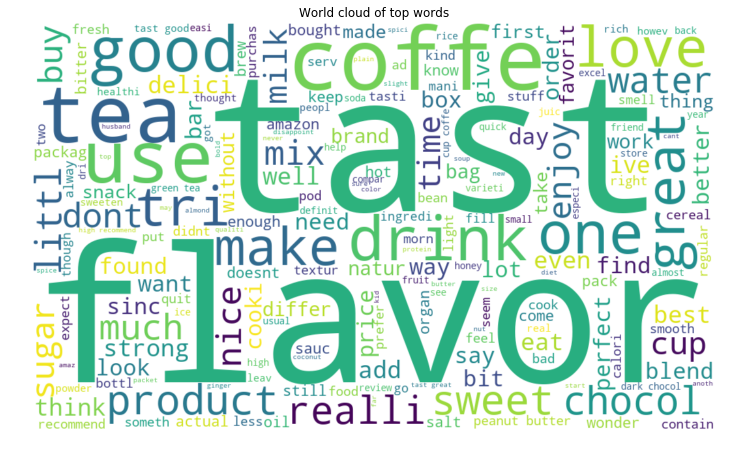

In [68]:
# same as average word2vec of k means clustering
for i in range(AC.n_clusters):
    l = list()
    label = x.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(x.loc[label[j]]["CleanedText"])
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

**Inference**
- Cluster 1 - This has grupoed all reviews that talk about the taste, flavor, use, goodness of a product/food item. 
- Cluster 2 - This has gropued all reviews related to tea & coffee.

**Number of Clusters=5**

In [69]:
AC = AgglomerativeClustering(n_clusters = 5, affinity = "euclidean", linkage = "ward")
labels = AC.fit_predict(x_tfw2v)

In [70]:
# Assign each review to its cluster label in dataframe
x["cluster_label"] = AC.labels_

Total number of review in cluster 0 is: 864


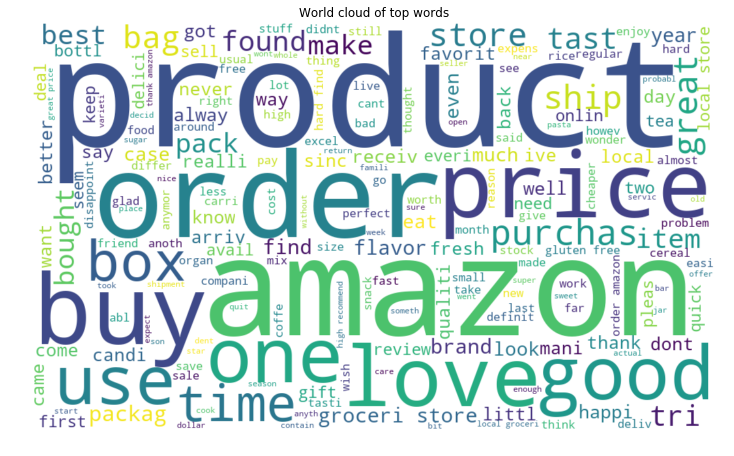

Total number of review in cluster 1 is: 1247


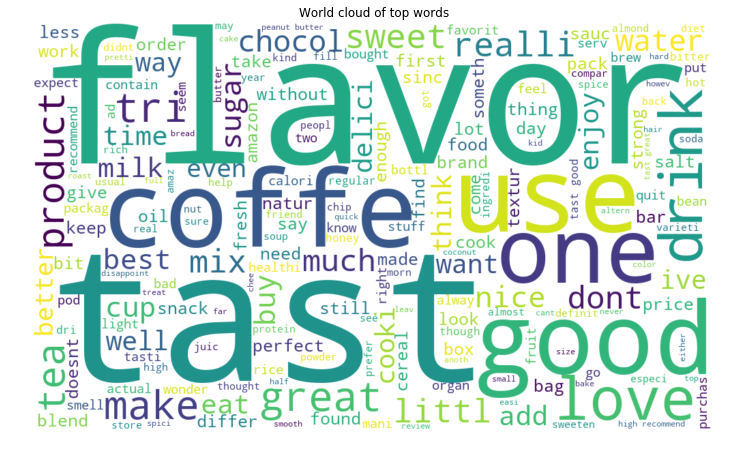

Total number of review in cluster 2 is: 2287


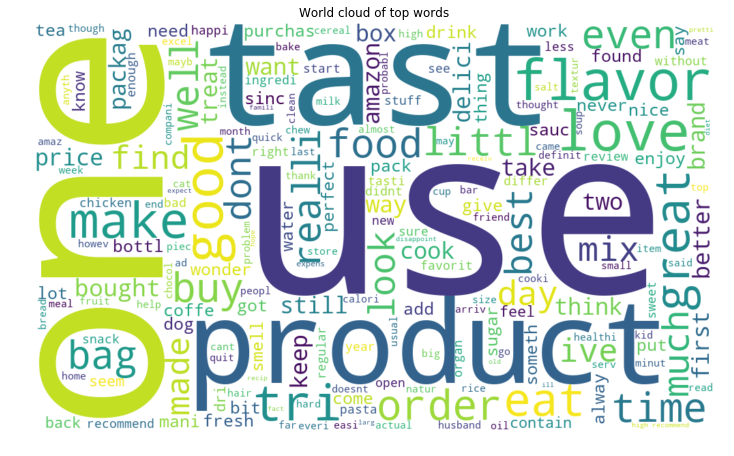

Total number of review in cluster 3 is: 251


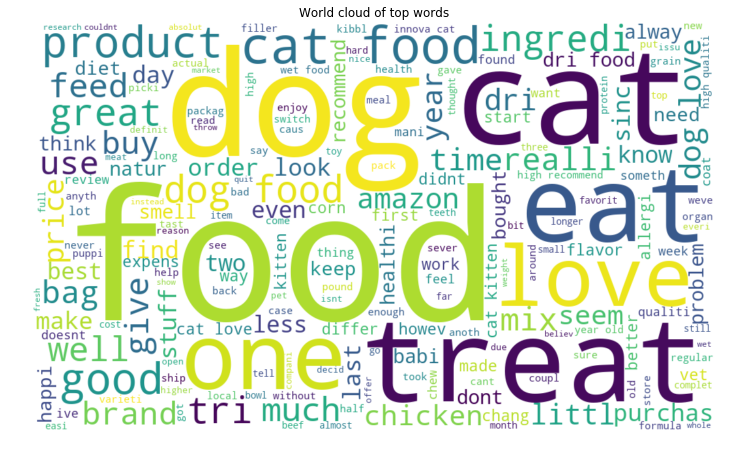

Total number of review in cluster 4 is: 351


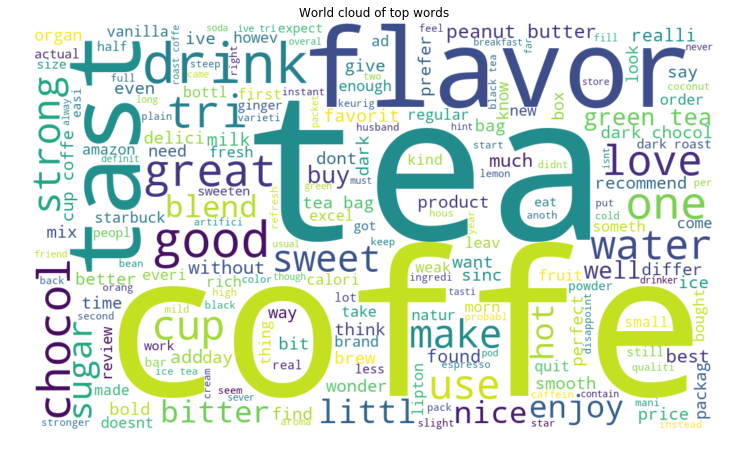

In [71]:
# same as average word2vec of k means clustering
for i in range(AC.n_clusters):
    l = list()
    label = x.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(x.loc[label[j]]["CleanedText"])
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

**Inference**
- Cluster 1 - This talks about amazons services and products. It aso has grouped reviews which talks about price of products. 
- Cluster 2 - This has gruoped reviews related to the use of a product as well as their taste & flavor and how good they are.
- Cluster 3 - This has gropued all reviews related to use & taste of a product.
- Cluster 4 - This has gruoped reviews related dog & cat food.
- Cluster 5 - This has gropued all reviews related to tea & coffee, their flavor etc.

## [5.0] DBSCAN Clustering

### [5.1] Applying DBSCAN on AVG W2V,<font color='red'> SET 3</font>

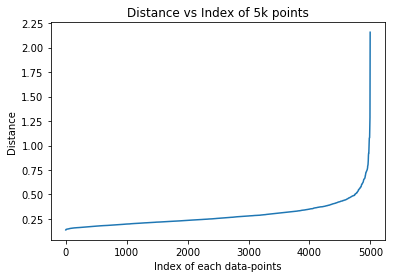

In [22]:
# Elbow method to choose eps(epsilon) with minpts = 2 * dimension of data (ie. 50*2=100)
from sklearn.neighbors import NearestNeighbors
minpts = 100
d = {}
clf = NearestNeighbors(n_neighbors = minpts, metric = "euclidean")
# Fitting classifier
clf.fit(x_w2v)
# Find the k neighbors of each xi and will return distance to its neighbors and indices of each xi's
dist_idx = clf.kneighbors(n_neighbors = minpts, return_distance = True)
dist_idx = np.array(dist_idx)
# Get the distance and indices of the last neighbor
for dist, idx in zip(dist_idx[0], dist_idx[1]):
    d[idx[-1]] = dist[-1]
# Sort distances according to ascending order
sorted_d = sorted((value,key) for (key, value) in d.items())
distance = []
index = []
# Get the index and distance and store it in two different variable
for d, i in sorted_d:
    distance.append(d)
    index.append(i)
# Plot index on x-axis and distance on y-axis
plt.plot(sorted(index), distance)
plt.title("Distance vs Index of 5k points")
plt.xlabel("Index of each data-points")
plt.ylabel("Distance")
plt.show()

In [23]:
# DBSCAN 
db = DBSCAN(eps = 0.75, min_samples = 100)
db.fit(x_w2v)
label = db.labels_
label

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [24]:
# Total number of data-points from each cluster 
# -1 shows it is noisy data-points 
print(list(label).count(0))
print(list(label).count(-1))

4995
5


In [25]:
# Put each cluster label with their corresponding data-points.
x["cluster_label"] = db.labels_

Total number of review in cluster 0 is: 4995


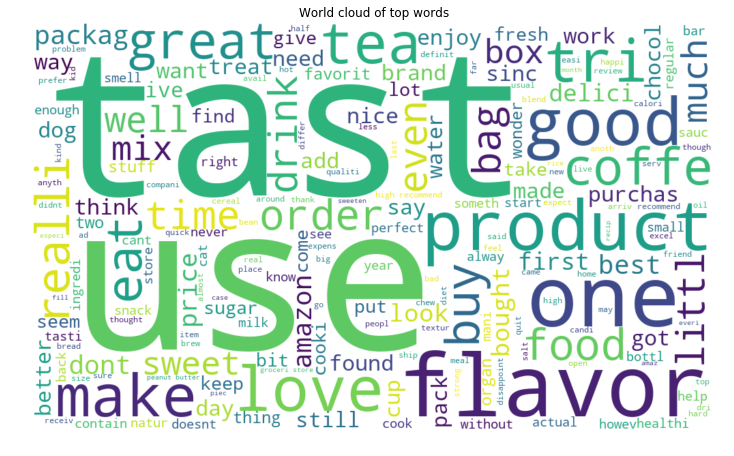

In [26]:
# Same as average word2vec of k means clustering
for i in range(len(set(label)) - 1):
    l = list()
    label = x.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(x.loc[label[j]]["CleanedText"])
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

### [5.2] Applying DBSCAN on TFIDF W2V,<font color='red'> SET 4</font>

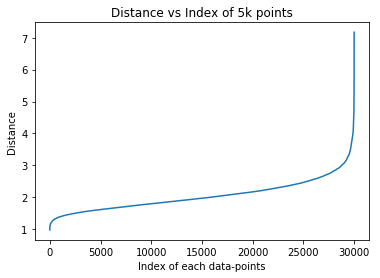

In [24]:
# Elbow method to choose eps(epsilon) with minpts = 2 * dimension of data (ie. 50*2=100)
from sklearn.neighbors import NearestNeighbors
minpts = 100
d = {}
clf = NearestNeighbors(n_neighbors = minpts, metric = "euclidean")
# Fitting classifier
clf.fit(x_tfw2v)
# Find the k neighbors of each xi and will return distance to its neighbors and indices of each xi's
dist_idx = clf.kneighbors(n_neighbors = minpts, return_distance = True)
dist_idx = np.array(dist_idx)
# Get the distance and indices of the last neighbor
for dist, idx in zip(dist_idx[0], dist_idx[1]):
    d[idx[-1]] = dist[-1]
# Sort distances according to ascending order
sorted_d = sorted((value,key) for (key, value) in d.items())
distance = []
index = []
# Get the index and distance and store it in two different variable
for d, i in sorted_d:
    distance.append(d)
    index.append(i)
# Plot index on x-axis and distance on y-axis
plt.plot(sorted(index), distance)
plt.title("Distance vs Index of 5k points")
plt.xlabel("Index of each data-points")
plt.ylabel("Distance")
plt.show()

In [34]:
# DBSCAN 
db = DBSCAN(eps = 3.0, min_samples = 100)
db.fit(x_w2v)
label = db.labels_
label

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [35]:
# Total number of data-points from each cluster 
# -1 shows it is noisy data-points 
print(list(label).count(0))
print(list(label).count(-1))

29992
8


In [36]:
# Put each cluster label with their corresponding data-points.
x["cluster_label"] = db.labels_

Total number of review in cluster 0 is: 29992


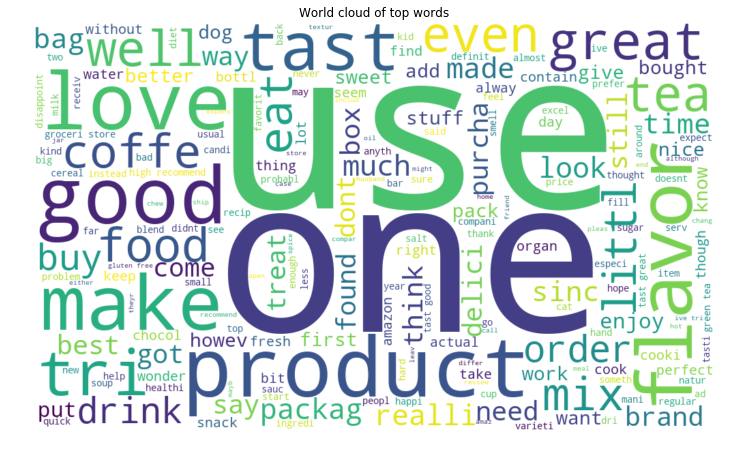

In [37]:
# Same as average word2vec of k means clustering
for i in range(len(set(label)) - 1):
    l = list()
    label = x.groupby(["cluster_label"]).groups[i]
    for j in range(len(label)):
        l.append(x.loc[label[j]]["CleanedText"])
    print("Total number of review in cluster {} is: {}".format(i, len(label)))
    plot_word_cloud(l)

## [6.0] Conclusion

In [41]:
t=PrettyTable()
t.field_names = ['Vectorizer', 'No. of Clusters']
t.add_row(['BOW', '6'])
t.add_row(['TFIDF', '7'])
t.add_row(['Avg W2V', '6'])
t.add_row(['TFIDF-W2V', '6'])
print('***** KMeans Clustering *****')
print(t)

***** KMeans Clustering *****
+------------+-----------------+
| Vectorizer | No. of Clusters |
+------------+-----------------+
|    BOW     |        6        |
|   TFIDF    |        7        |
|  Avg W2V   |        6        |
| TFIDF-W2V  |        6        |
+------------+-----------------+


In [45]:
t=PrettyTable()
t.field_names = ['Vectorizer', 'No. of Clusters']
t.add_row(['Avg W2V', '2,5'])
t.add_row(['TFIDF-W2V', '2,5'])
print('***** Agglomerative Clustering *****')
print(t)

***** Agglomerative Clustering *****
+------------+-----------------+
| Vectorizer | No. of Clusters |
+------------+-----------------+
|  Avg W2V   |       2,5       |
| TFIDF-W2V  |       2,5       |
+------------+-----------------+


In [42]:
t=PrettyTable()
t.field_names = ['Vectorizer', 'No. of Clusters', 'minpts', 'eps']
t.add_row(['Avg W2V', '2', '100', '0.75'])
t.add_row(['TFIDF-W2V', '2', '100', '1.0'])
print('***** DBSCAN *****')
print(t)

***** DBSCAN *****
+------------+-----------------+
| Vectorizer | No. of Clusters |
+------------+-----------------+
|    BOW     |        6        |
|   TFIDF    |        7        |
|  Avg W2V   |        6        |
| TFIDF-W2V  |        6        |
+------------+-----------------+
